# LEAD SCORING CASE STUDY

###  Problem Statement
An education company named X Education sells online courses to industry professionals. On any given day, many professionals who are interested in the courses land on their website and browse for courses.

The company markets its courses on several websites and search engines like Google. Once these people land on the website, they might browse the courses or fill up a form for the course or watch some videos. When these people fill up a form providing their email address or phone number, they are classified to be a lead. Moreover, the company also gets leads through past referrals. Once these leads are acquired, employees from the sales team start making calls, writing emails, etc. Through this process, some of the leads get converted while most do not. The typical lead conversion rate at X education is around 30%.

There are a lot of leads generated in the initial stage, but only a few of them come out as paying customers. In the middle stage, you need to nurture the potential leads well (i.e. educating the leads about the product, constantly communicating etc. ) in order to get a higher lead conversion.

X Education has appointed you to help them select the most promising leads, i.e. the leads that are most likely to convert into paying customers. The company requires you to build a model wherein you need to assign a lead score to each of the leads such that the customers with higher lead score have a higher conversion chance and the customers with lower lead score have a lower conversion chance. The CEO, in particular, has given a ballpark of the target lead conversion rate to be around 80%.

### Goals of the Case Study
Build a logistic regression model to assign a lead score between 0 and 100 to each of the leads which can be used by the company to target potential leads. A higher score would mean that the lead is hot, i.e. is most likely to convert whereas a lower score would mean that the lead is cold and will mostly not get converted.

### Approach
- Importing Data
- Inspecting the Dataframe
- Data Preparation (Encoding Categorical Variables, Handling Null Values, outlier detection)
- EDA (univariate analysis, checking data imbalance)
- Dummy Variable Creation
- Test-Train Split
- Feature Scaling
- Looking at Correlations
- Model Building (Feature Selection Using RFE, Improvising the model further inspecting adjusted R-squared, VIF and p-vales)
- Build final model
- Model evaluation with different metrics Sensitivity, Specificity

## Importing Data

In [1]:
#Importing Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid")

# model building
from sklearn.model_selection import train_test_split 
from sklearn.preprocessing import StandardScaler 
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE

# model evaluation
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score
from sklearn.metrics import precision_recall_curve

# To ignore warnings
import warnings
warnings.filterwarnings('ignore')

# To display all rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

## Reading the dataset

In [2]:
# Reading the dataset
df_leads = pd.read_csv("Leads.csv")
df_leads.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,NaN,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Interested in other courses,Low in Relevance,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,NaN,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Select,Student,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Word Of Mouth,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,Not Sure,No,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,India,Select,Other,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


## Data Understanding

In [3]:
# Checking the first 5 rows of the dataframe
df_leads.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,NaN,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Interested in other courses,Low in Relevance,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,Select,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,NaN,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Select,Student,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Word Of Mouth,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Ringing,Not Sure,No,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,India,Select,Other,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


In [4]:
# Checking the last 5 rows of the dataframe
df_leads.tail()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
9235,19d6451e-fcd6-407c-b83b-48e1af805ea9,579564,Landing Page Submission,Direct Traffic,Yes,No,1,8.0,1845,2.67,Email Marked Spam,Saudi Arabia,IT Projects Management,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,High in Relevance,No,No,Potential Lead,Mumbai,02.Medium,01.High,15.0,17.0,No,No,Email Marked Spam
9236,82a7005b-7196-4d56-95ce-a79f937a158d,579546,Landing Page Submission,Direct Traffic,No,No,0,2.0,238,2.00,SMS Sent,India,Media and Advertising,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,wrong number given,Might be,No,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,19.0,No,Yes,SMS Sent
9237,aac550fe-a586-452d-8d3c-f1b62c94e02c,579545,Landing Page Submission,Direct Traffic,Yes,No,0,2.0,199,2.00,SMS Sent,India,Business Administration,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,invalid number,Not Sure,No,No,Potential Lead,Mumbai,02.Medium,01.High,13.0,20.0,No,Yes,SMS Sent
9238,5330a7d1-2f2b-4df4-85d6-64ca2f6b95b9,579538,Landing Page Submission,Google,No,No,1,3.0,499,3.00,SMS Sent,India,Human Resource Management,Online Search,NaN,NaN,No,No,No,No,No,No,No,No,NaN,NaN,No,No,NaN,Other Metro Cities,02.Medium,02.Medium,15.0,16.0,No,No,SMS Sent
9239,571b5c8e-a5b2-4d57-8574-f2ffb06fdeff,579533,Landing Page Submission,Direct Traffic,No,No,1,6.0,1279,3.00,SMS Sent,Bangladesh,Supply Chain Management,Select,Unemployed,Better Career Prospects,No,No,No,No,No,No,No,No,Will revert after reading the email,Might be,No,No,Potential Lead,Other Cities,02.Medium,01.High,15.0,18.0,No,Yes,Modified


In [5]:
# Checking the number of rows and columns
df_leads.shape

(9240, 37)

In [6]:
# Checking the column-wise info of the dataframe
df_leads.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

In [7]:
# Checking the column names
df_leads.columns.to_list()

['Prospect ID',
 'Lead Number',
 'Lead Origin',
 'Lead Source',
 'Do Not Email',
 'Do Not Call',
 'Converted',
 'TotalVisits',
 'Total Time Spent on Website',
 'Page Views Per Visit',
 'Last Activity',
 'Country',
 'Specialization',
 'How did you hear about X Education',
 'What is your current occupation',
 'What matters most to you in choosing a course',
 'Search',
 'Magazine',
 'Newspaper Article',
 'X Education Forums',
 'Newspaper',
 'Digital Advertisement',
 'Through Recommendations',
 'Receive More Updates About Our Courses',
 'Tags',
 'Lead Quality',
 'Update me on Supply Chain Content',
 'Get updates on DM Content',
 'Lead Profile',
 'City',
 'Asymmetrique Activity Index',
 'Asymmetrique Profile Index',
 'Asymmetrique Activity Score',
 'Asymmetrique Profile Score',
 'I agree to pay the amount through cheque',
 'A free copy of Mastering The Interview',
 'Last Notable Activity']

In [8]:
# Checking the summary of the dataframe
df_leads.describe()

,Lead Number,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9240.000000,9240.000000,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,617188.435606,0.385390,3.445238,487.698268,2.362820,14.306252,16.344883
std,23405.995698,0.486714,4.854853,548.021466,2.161418,1.386694,1.811395
min,579533.000000,0.000000,0.000000,0.000000,0.000000,7.000000,11.000000
25%,596484.500000,0.000000,1.000000,12.000000,1.000000,14.000000,15.000000
50%,615479.000000,0.000000,3.000000,248.000000,2.000000,14.000000,16.000000
75%,637387.250000,1.000000,5.000000,936.000000,3.000000,15.000000,18.000000
max,660737.000000,1.000000,251.000000,2272.000000,55.000000,18.000000,20.000000


In [9]:
# Checking the null value presentage in the dataset 
round(100*(df_leads.isnull().sum()/len(df_leads.index)), 2).sort_values(ascending=False)

Lead Quality                                     51.59
Asymmetrique Activity Index                      45.65
Asymmetrique Profile Score                       45.65
Asymmetrique Activity Score                      45.65
Asymmetrique Profile Index                       45.65
Tags                                             36.29
Lead Profile                                     29.32
What matters most to you in choosing a course    29.32
What is your current occupation                  29.11
Country                                          26.63
How did you hear about X Education               23.89
Specialization                                   15.56
City                                             15.37
Page Views Per Visit                              1.48
TotalVisits                                       1.48
Last Activity                                     1.11
Lead Source                                       0.39
Receive More Updates About Our Courses            0.00
I agree to

## Data Preprocessing

#### Converting Yes/No to 1/0's:

In [10]:
# Encoding the variables with yes/no labels as 1/0
for column in df_leads:
    if df_leads[column].dtype=='object':
        df_leads[column] = df_leads[column].replace({'Yes':1,'No':0})
df_leads.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Search,Magazine,Newspaper Article,X Education Forums,Newspaper,Digital Advertisement,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,0,0,0,0.0,0,0.0,Page Visited on Website,NaN,Select,Select,Unemployed,Better Career Prospects,0,0,0,0,0,0,0,0,Interested in other courses,Low in Relevance,0,0,Select,Select,02.Medium,02.Medium,15.0,15.0,0,0,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,0,0,0,5.0,674,2.5,Email Opened,India,Select,Select,Unemployed,Better Career Prospects,0,0,0,0,0,0,0,0,Ringing,NaN,0,0,Select,Select,02.Medium,02.Medium,15.0,15.0,0,0,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,0,0,1,2.0,1532,2.0,Email Opened,India,Business Administration,Select,Student,Better Career Prospects,0,0,0,0,0,0,0,0,Will revert after reading the email,Might be,0,0,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,0,1,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,0,0,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Word Of Mouth,Unemployed,Better Career Prospects,0,0,0,0,0,0,0,0,Ringing,Not Sure,0,0,Select,Mumbai,02.Medium,01.High,13.0,17.0,0,0,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,0,0,1,2.0,1428,1.0,Converted to Lead,India,Select,Other,Unemployed,Better Career Prospects,0,0,0,0,0,0,0,0,Will revert after reading the email,Might be,0,0,Select,Mumbai,02.Medium,01.High,15.0,18.0,0,0,Modified


### Checking for outliers

In [11]:
# Checking for outliers in the continuous variables
out_lead = df_leads[['TotalVisits','Total Time Spent on Website','Page Views Per Visit','Asymmetrique Activity Score',
                 'Asymmetrique Profile Score']]
out_lead.describe(percentiles=[0.25,0.5,0.75,0.9,0.99])

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Asymmetrique Activity Score,Asymmetrique Profile Score
count,9103.000000,9240.000000,9103.000000,5022.000000,5022.000000
mean,3.445238,487.698268,2.362820,14.306252,16.344883
std,4.854853,548.021466,2.161418,1.386694,1.811395
min,0.000000,0.000000,0.000000,7.000000,11.000000
25%,1.000000,12.000000,1.000000,14.000000,15.000000
50%,3.000000,248.000000,2.000000,14.000000,16.000000
75%,5.000000,936.000000,3.000000,15.000000,18.000000
90%,7.000000,1380.000000,5.000000,16.000000,19.000000
99%,17.000000,1840.610000,9.000000,17.000000,20.000000
max,251.000000,2272.000000,55.000000,18.000000,20.000000


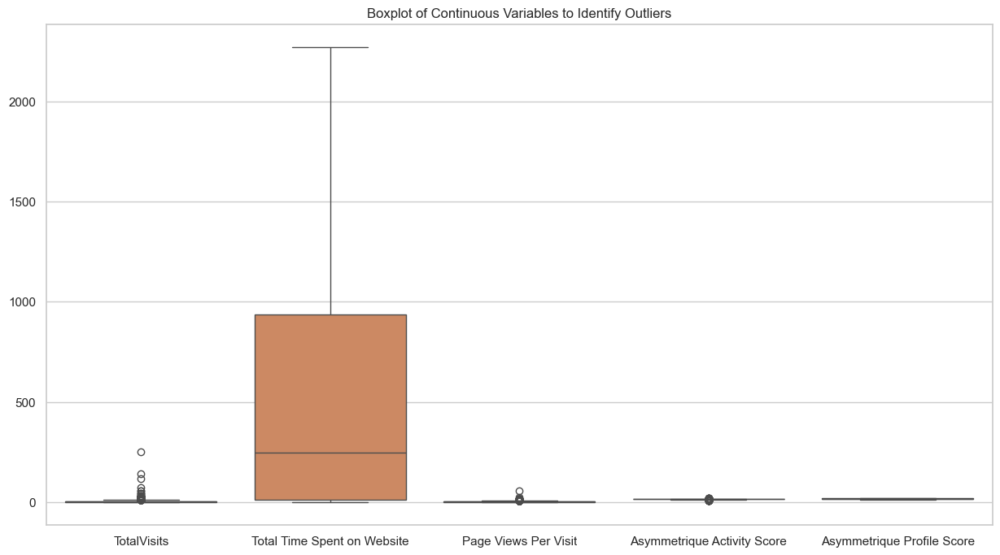

In [12]:
# Let's visualize these columns for a clearer understanding
plt.figure(figsize=(15,8))
sns.boxplot(data=out_lead)
plt.title('Boxplot of Continuous Variables to Identify Outliers')
plt.show()

**Inference**

Consistent Engagement: ‘Page Views Per Visit’, ‘Asymmetrique Activity Score’, and ‘Asymmetrique Profile Score’ have consistent values, suggesting uniform engagement levels.

Data Cleaning Indication: Presence of outliers in certain variables may indicate the need for data cleaning before further analysis.



In [13]:
# Determine the 95th percentile of the Total Visits 
q95 = df_leads["TotalVisits"].quantile(0.95)

# Cap the outliers at the 95th percentile value 
df_leads["TotalVisits"] = np.where(df_leads["TotalVisits"] > q95, q95, df_leads["TotalVisits"])
print(df_leads["TotalVisits"].describe())

count    9103.000000
mean        3.181918
std         2.781834
min         0.000000
25%         1.000000
50%         3.000000
75%         5.000000
max        10.000000
Name: TotalVisits, dtype: float64


In [14]:
# Determine the 95th percentile of the Total Visits data
q95 = df_leads["Page Views Per Visit"].quantile(0.95)

# Cap the outliers at the 95th percentile value
df_leads["Page Views Per Visit"] = np.where(df_leads["Page Views Per Visit"] > q95, q95, df_leads["Page Views Per Visit"])
print(df_leads["Page Views Per Visit"].describe())

count    9103.000000
mean        2.258944
std         1.792536
min         0.000000
25%         1.000000
50%         2.000000
75%         3.000000
max         6.000000
Name: Page Views Per Visit, dtype: float64


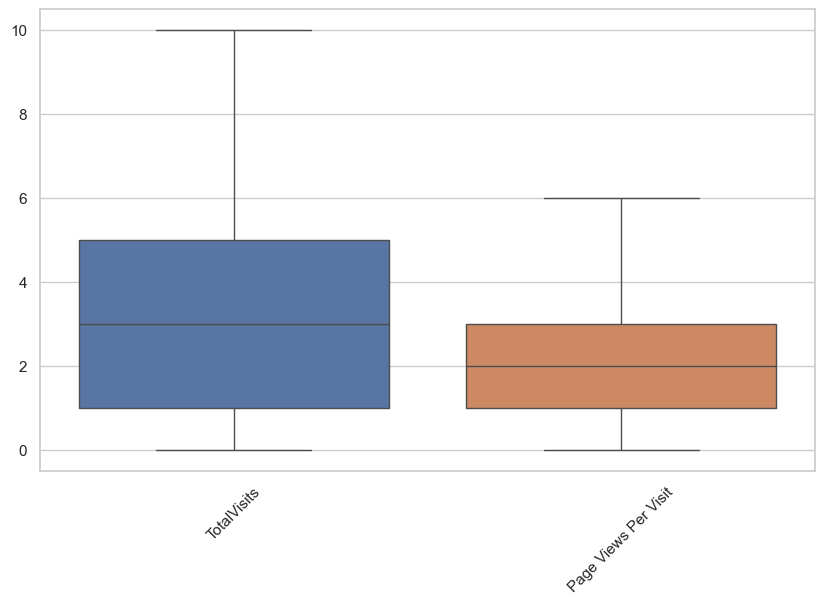

In [15]:
# Checking the plot again for the absence of outliers
lead_vis = df_leads[['TotalVisits','Page Views Per Visit']]

plt.figure(figsize=(10,6))
sns.boxplot(data=lead_vis)
plt.xticks(rotation=45)
plt.show()

#### Inference

The outliers have been removed from the Total Visits and Page Views Per Visit columns.

TotalVisits: The median is around 4, with most data falling between 2 and 6. This suggests a moderate level of site visits.

Page Views per Visit: The median is slightly above 2, with most data between 0 and 4. This indicates that each visit involves viewing a few pages.

#### Converting SELECTs into NaNs:

In [16]:
# Listing the categorical variables yet to be encoded in the dataset
df_leads.select_dtypes(include=['object']).info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 16 columns):
 #   Column                                         Non-Null Count  Dtype 
---  ------                                         --------------  ----- 
 0   Prospect ID                                    9240 non-null   object
 1   Lead Origin                                    9240 non-null   object
 2   Lead Source                                    9204 non-null   object
 3   Last Activity                                  9137 non-null   object
 4   Country                                        6779 non-null   object
 5   Specialization                                 7802 non-null   object
 6   How did you hear about X Education             7033 non-null   object
 7   What is your current occupation                6550 non-null   object
 8   What matters most to you in choosing a course  6531 non-null   object
 9   Tags                                           5887 non-null   

In [17]:
# Checking the labels of the remaining categorical columns in the dataset
def print_value_counts(df):
    object_cols = df.select_dtypes(include='object').columns
    for col in object_cols:
        print(f"Column: {col}")
        print("_________________________________________________________________________________________________")
        print(df[col].value_counts(normalize=True))
        print("_________________________________________________________________________________________________")
print_value_counts(df_leads.iloc[:, 1:])

Column: Lead Origin
_________________________________________________________________________________________________
Lead Origin
Landing Page Submission    0.528788
API                        0.387446
Lead Add Form              0.077706
Lead Import                0.005952
Quick Add Form             0.000108
Name: proportion, dtype: float64
_________________________________________________________________________________________________
Column: Lead Source
_________________________________________________________________________________________________
Lead Source
Google               0.311604
Direct Traffic       0.276293
Olark Chat           0.190678
Organic Search       0.125380
Reference            0.058018
Welingak Website     0.015428
Referral Sites       0.013581
Facebook             0.005976
bing                 0.000652
google               0.000543
Click2call           0.000435
Press_Release        0.000217
Social Media         0.000217
Live Chat            0.000217
youtubech

In [18]:
# Converting all the selects to NaN as the user didnt select any option from the list and "Select" is as good as "NaN"
df_leads = df_leads.replace('Select', np.nan)

In [19]:
# Checking info
df_leads.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   int64  
 5   Do Not Call                                    9240 non-null   int64  
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

In [20]:
# Checking the percentage of missing values in each column
round(100*(df_leads.isnull().sum()/len(df_leads.index)), 2).sort_values(ascending = False)

How did you hear about X Education               78.46
Lead Profile                                     74.19
Lead Quality                                     51.59
Asymmetrique Profile Score                       45.65
Asymmetrique Activity Score                      45.65
Asymmetrique Activity Index                      45.65
Asymmetrique Profile Index                       45.65
City                                             39.71
Specialization                                   36.58
Tags                                             36.29
What matters most to you in choosing a course    29.32
What is your current occupation                  29.11
Country                                          26.63
Page Views Per Visit                              1.48
TotalVisits                                       1.48
Last Activity                                     1.11
Lead Source                                       0.39
Receive More Updates About Our Courses            0.00
I agree to

### Missing Value Handling

In [21]:
# Dropping columns that contain more than 40% null values
threshold = df_leads.shape[0] * 0.60
df_leads = df_leads.dropna(axis=1, thresh=threshold)

In [22]:
# City - We can impute the MUMBAI into all the NULLs as most of the values belong to MUMBAI
df_leads['City'] = df_leads['City'].replace(np.nan, 'Mumbai')

# Specialization - We can impute the "Other_Specialization" into all the NULLs as most of the values belong to "Other_Specialization"
df_leads['Specialization'] = df_leads['Specialization'].replace(np.nan, 'Other_Specialization')

# Tags - We can impute the "Other_Tags" into all the NULLs as most of the values belong to "Other_Tags"
df_leads['Tags'] = df_leads['Tags'].replace(np.nan, 'Other_Tags')

# More than 99% data is of "Better Career Prospects" and hence it is safer to impute NULLS with this value
df_leads['What matters most to you in choosing a course'] = df_leads['What matters most to you in choosing a course'].replace(np.nan, 'Better Career Prospects')

# More than 85% data is of "Unemployed" and hence it is safer to impute NULLS with this value
df_leads['What is your current occupation'] = df_leads['What is your current occupation'].replace(np.nan, 'Unemployed')

# More than 95% data is of "India" and hence it is safer to impute NULLS with this value
df_leads['Country'] = df_leads['Country'].replace(np.nan, 'India')

In [23]:
# Checking the percentage of missing values in each column
round(100*(df_leads.isnull().sum()/len(df_leads.index)), 2).sort_values(ascending = False)

TotalVisits                                      1.48
Page Views Per Visit                             1.48
Last Activity                                    1.11
Lead Source                                      0.39
Prospect ID                                      0.00
Newspaper                                        0.00
Digital Advertisement                            0.00
Through Recommendations                          0.00
Receive More Updates About Our Courses           0.00
Tags                                             0.00
Update me on Supply Chain Content                0.00
Newspaper Article                                0.00
Get updates on DM Content                        0.00
City                                             0.00
I agree to pay the amount through cheque         0.00
A free copy of Mastering The Interview           0.00
X Education Forums                               0.00
Search                                           0.00
Magazine                    

In [24]:
# Remaining NULL values are less than 2% and hence these rows can be directly dropped
df_leads.dropna(inplace = True)
print(df_leads.shape)

(9074, 30)


In [25]:
# Checking the isnull
df_leads.isnull().sum()

Prospect ID                                      0
Lead Number                                      0
Lead Origin                                      0
Lead Source                                      0
Do Not Email                                     0
Do Not Call                                      0
Converted                                        0
TotalVisits                                      0
Total Time Spent on Website                      0
Page Views Per Visit                             0
Last Activity                                    0
Country                                          0
Specialization                                   0
What is your current occupation                  0
What matters most to you in choosing a course    0
Search                                           0
Magazine                                         0
Newspaper Article                                0
X Education Forums                               0
Newspaper                      

In [26]:
# Percentage of rows retained 
(len(df_leads.index)/9240)*100

98.2034632034632

We have retained 98% of the rows after cleaning the data.

In [27]:
df_leads.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9074 entries, 0 to 9239
Data columns (total 30 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9074 non-null   object 
 1   Lead Number                                    9074 non-null   int64  
 2   Lead Origin                                    9074 non-null   object 
 3   Lead Source                                    9074 non-null   object 
 4   Do Not Email                                   9074 non-null   int64  
 5   Do Not Call                                    9074 non-null   int64  
 6   Converted                                      9074 non-null   int64  
 7   TotalVisits                                    9074 non-null   float64
 8   Total Time Spent on Website                    9074 non-null   int64  
 9   Page Views Per Visit                           9074 non-n

### Checking for duplicates:

In [28]:
# Duplicate rows in the dataset
df_leads.duplicated().sum()

0

We see there are no duplicate records in our lead dataset.

## Visualization

In [29]:
# Lets start with the target variable and see if we have any data imbalance or not 
df_leads["Converted"].value_counts(normalize=True)

Converted
0    0.621446
1    0.378554
Name: proportion, dtype: float64

We have a well-represented distribution across both classes of data, which positions us favorably for further analysis.

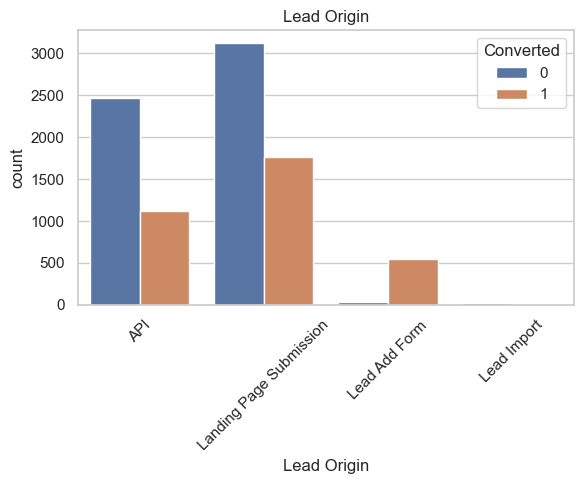

In [30]:
# Count plot for 'Lead Origin'
features = ['Lead Origin']

# Create subplots
fig, axes = plt.subplots(1, len(features), figsize=(6, 5))

# Ensure axes is always a list, even if there's only one feature
if len(features) == 1:
    axes = [axes]

# Loop through the features and create count plots
for i, feature in enumerate(features):
    sns.countplot(data=df_leads, x=feature, hue="Converted", ax=axes[i])
    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=45)
# title
axes[0].set_title("Lead Origin")
# Adjust spacing between subplots
fig.tight_layout()

# Adjust layout
plt.tight_layout()
plt.show()

#### Inference

**Landing Page Submission:** Highest count for both converted and not converted leads, indicating it’s the most used method.

**API:** Second-highest count, suggesting it’s also a significant source of leads.

**Lead Add Form:** Moderate count with a higher conversion rate, implying it’s an effective method for quality leads.

**Lead Import:** Low count with no conversions, indicating it’s not an effective lead source.


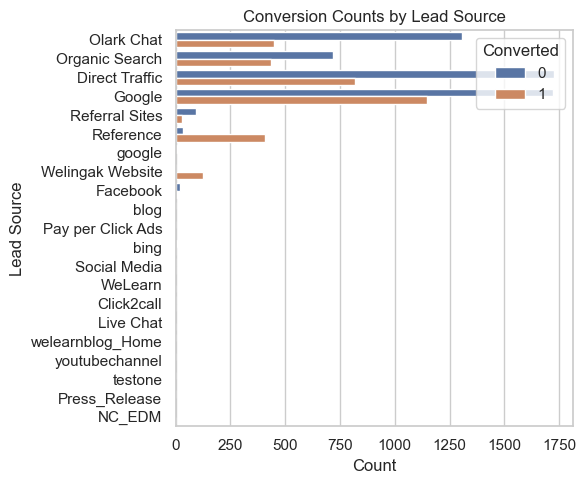

In [31]:
# bar plot for lead source
plt.figure(figsize=(6, 5))
sns.countplot(y="Lead Source", hue="Converted", data=df_leads)
plt.title('Conversion Counts by Lead Source')
plt.ylabel('Lead Source')
plt.xlabel('Count')
plt.legend(title='Converted', loc='upper right')
plt.tight_layout()
plt.show()

In [32]:
# We can clearly observe that the count of leads from various sources are close to negligible and hence we can club them into "Others" source for better visualisation and analysis

df_leads['Lead Source'] = df_leads['Lead Source'].replace(['Click2call', 'Live Chat', 'NC_EDM', 'Pay per Click Ads', 'Press_Release',
  'Social Media', 'WeLearn', 'bing', 'blog', 'testone', 'welearnblog_Home', 'youtubechannel'], 'Other_Lead_Source')

df_leads['Lead Source'] = df_leads['Lead Source'].replace("google", 'Google')

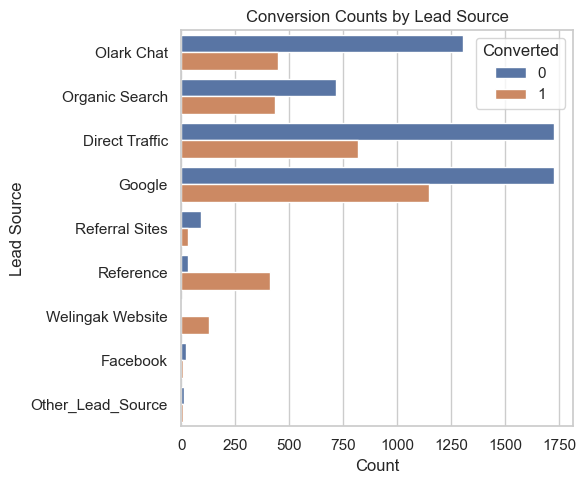

In [33]:
# bar plot for lead source
plt.figure(figsize=(6, 5))
sns.countplot(y="Lead Source", hue="Converted", data=df_leads)
plt.title('Conversion Counts by Lead Source')
plt.ylabel('Lead Source')
plt.xlabel('Count')
plt.legend(title='Converted', loc='upper right')
plt.tight_layout()
plt.show()

#### Inference

**Google** is the lead source with the highest count of both converted and not converted leads, indicating it’s a major channel for potential customers.

**Direct Traffic** is the second most significant source, showing good potential in attracting convertible leads.

**Facebook** has a lower count of conversions, suggesting it may be less effective compared to other sources.

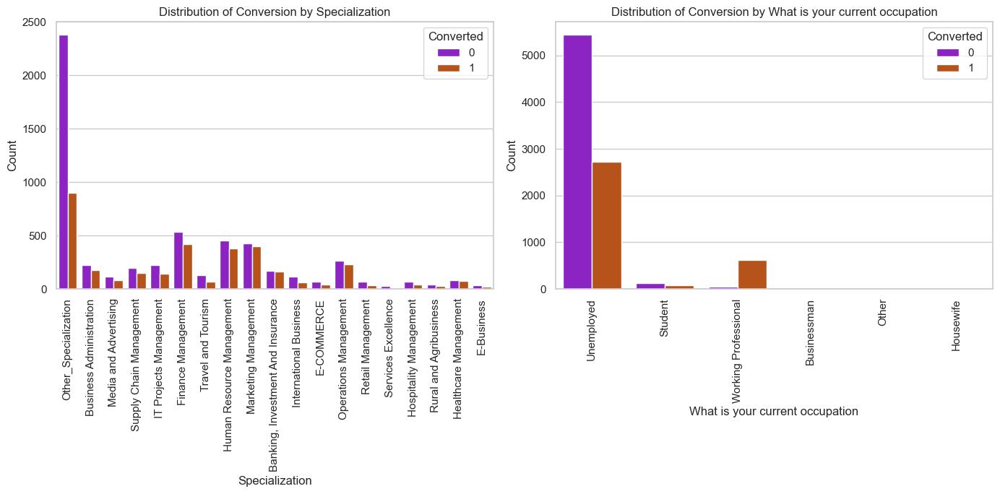

In [34]:
# subplots for Specialization and What is your current occupation
fig, axes = plt.subplots(1, 2, figsize=(14, 7))

# Loop through features and create stacked bar plots
features = ["Specialization", "What is your current occupation"]
for i, feature in enumerate(features):
    sns.countplot(x=feature, hue="Converted", data=df_leads, ax=axes[i], palette='gnuplot')
    axes[i].set_title(f'Distribution of Conversion by {feature}')
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Count')
    axes[i].legend(title='Converted', loc='upper right')
    axes[i].tick_params(axis='x', rotation=90)  # Rotate x-axis labels by 90 degrees

# Adjust layout
plt.subplots_adjust(hspace=0.5, wspace=0.3)
plt.tight_layout()
plt.show()

#### Inferences

**Specialization:** The graph shows various specializations with two sets of bars for each, indicating the count of conversions and non-conversions. Specializations like ‘Other_Specialization’ and ‘Business Administration’ have higher counts, suggesting they are common among leads.

**Occupation:** The graph displays different occupations with two sets of bars for each, representing the count of conversions and non-conversions. ‘Unemployed’ and ‘Student’ categories have higher counts, indicating they are prevalent occupations among leads.

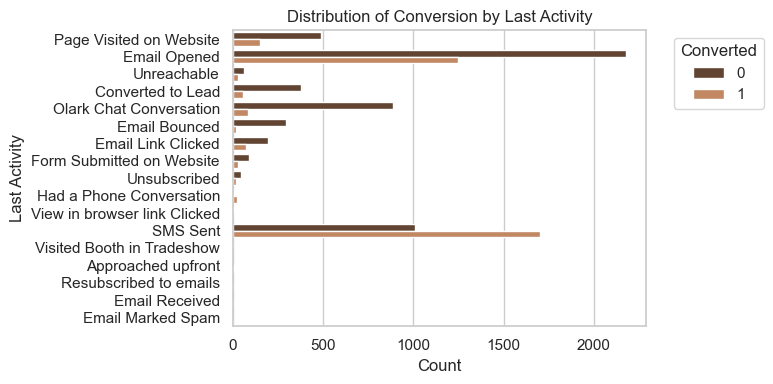

In [35]:
# visualising last activity
plt.figure(figsize=(8, 4))
sns.countplot(y="Last Activity", hue="Converted", data=df_leads, palette='copper')
plt.title('Distribution of Conversion by Last Activity')
plt.xlabel('Count')
plt.ylabel('Last Activity')
plt.legend(title='Converted', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

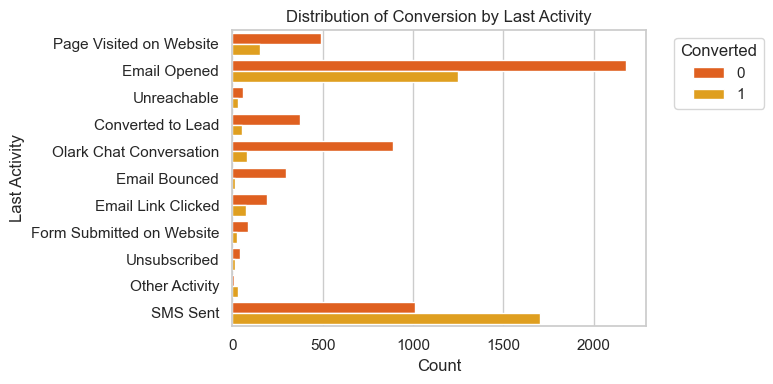

In [36]:

# Converting all the low count categories to the 'Others' category
df_leads['Last Activity'] = df_leads['Last Activity'].replace(['Had a Phone Conversation', 'View in browser link Clicked', 
                                                       'Visited Booth in Tradeshow', 'Approached upfront',
                                                       'Resubscribed to emails','Email Received', 'Email Marked Spam'], 'Other Activity')

# visualising last activity
plt.figure(figsize=(8, 4))
sns.countplot(y="Last Activity", hue="Converted", data=df_leads, palette='autumn')
plt.title('Distribution of Conversion by Last Activity')
plt.xlabel('Count')
plt.ylabel('Last Activity')
plt.legend(title='Converted', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

#### Inference

**Email Opened and SMS Sent**  have higher counts for both converted and not converted, indicating these activities are common before a conversion.

**Unreachable, Email Bounced, and Unsubscribed** show very few or no conversions, suggesting these activities are less likely to lead to a conversion.


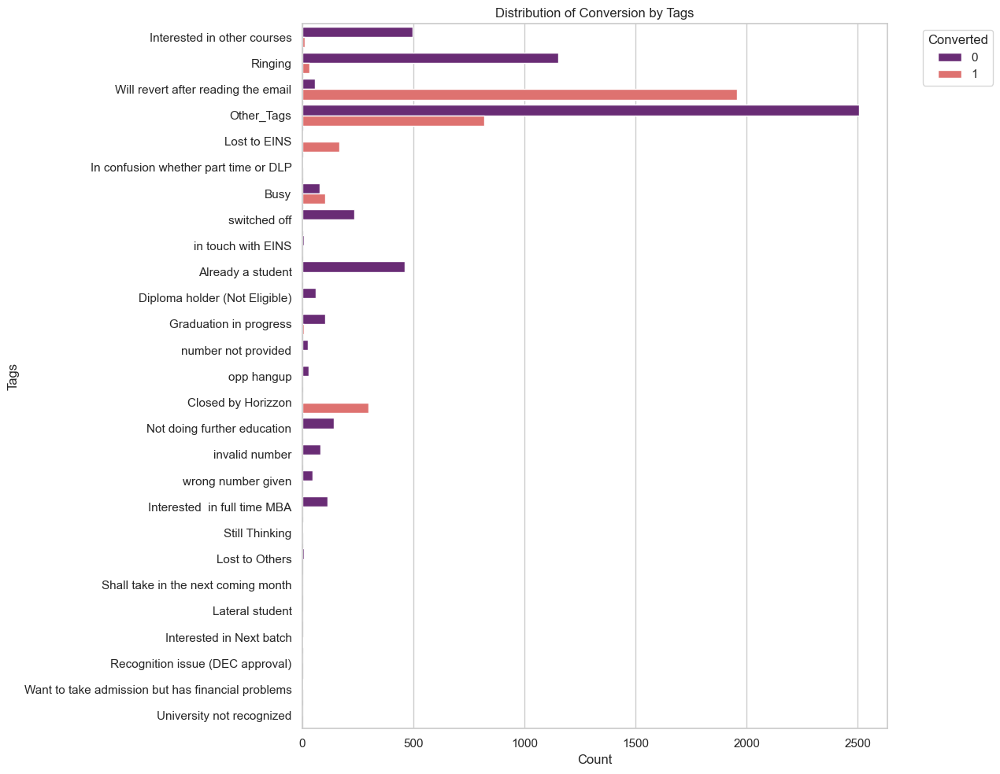

In [37]:
# barplot for tags
plt.figure(figsize=(13, 10))

# Create a horizontal bar plot
sns.countplot(y='Tags', hue='Converted', data=df_leads, palette='magma')
plt.title('Distribution of Conversion by Tags')
plt.xlabel('Count')
plt.ylabel('Tags')
plt.legend(title='Converted', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

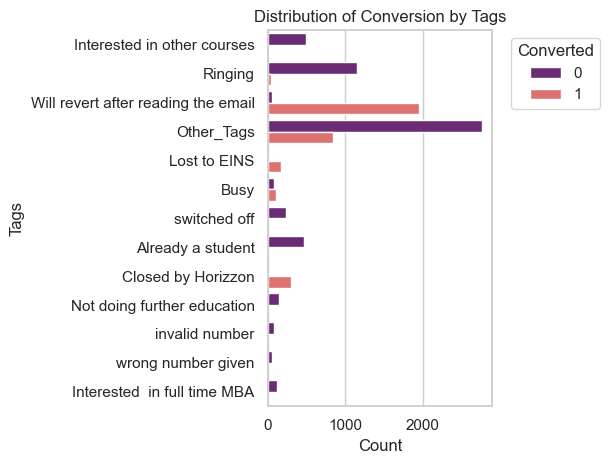

In [38]:
# Converting all low count categories to 'Others' category
df_leads['Tags'] = df_leads['Tags'].replace(['In confusion whether part time or DLP','in touch with EINS',
                                     'Diploma holder (Not Eligible)','Approached upfront','Graduation in progress',
                                     'number not provided','opp hangup','Still Thinking','Lost to Others',
                                     'Shall take in the next coming month','Lateral student','Interested in Next batch','Recognition issue (DEC approval)','Want to take admission but has financial problems',\
                                     'University not recognized'], 'Other_Tags')

# Create a horizontal bar plot
sns.countplot(y='Tags', hue='Converted', data=df_leads, palette='magma')
plt.title('Distribution of Conversion by Tags')
plt.xlabel('Count')
plt.ylabel('Tags')
plt.legend(title='Converted', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

#### Inference

**Interested in other courses:** High count, indicating a strong interest in exploring different courses.

**Ringing:** Moderate count, suggesting follow-up calls are a common occurrence.

**Will revert after reading the email:** This tag also has a moderate count, implying that email communication is an effective 
engagement strategy.

**Lost to EINS:** Lower count, indicating fewer losses to competitors or other institutions.

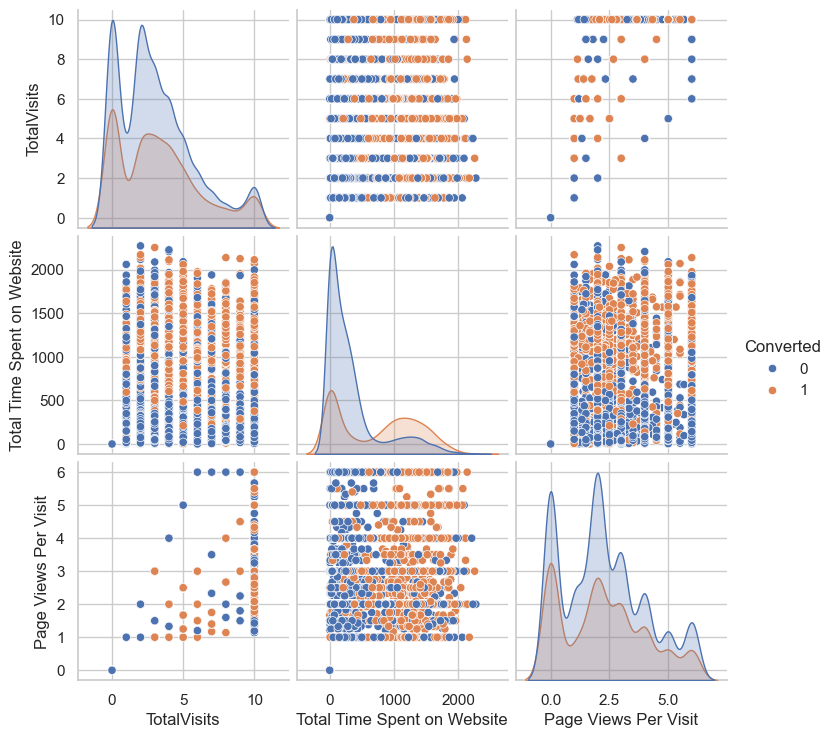

In [39]:
# Visualising Numeric Variables
lead_nm = df_leads[['TotalVisits','Total Time Spent on Website','Page Views Per Visit','Converted']]
sns.pairplot(lead_nm,diag_kind='kde',hue='Converted')
plt.show()
# Correlation for numeric variables
cor= lead_nm.corr()

#### Inference

**Total Time Spent on Website:** Shows a positive correlation with conversions, suggesting that longer visits may lead to higher conversion rates.

**Page Views Per Visit:** Also indicates a positive correlation, implying that viewing more pages is associated with a higher likelihood of conversion.

**Total Visits:** Does not show a clear trend with conversions, suggesting that the number of visits alone is not a strong indicator of conversion likelihood.


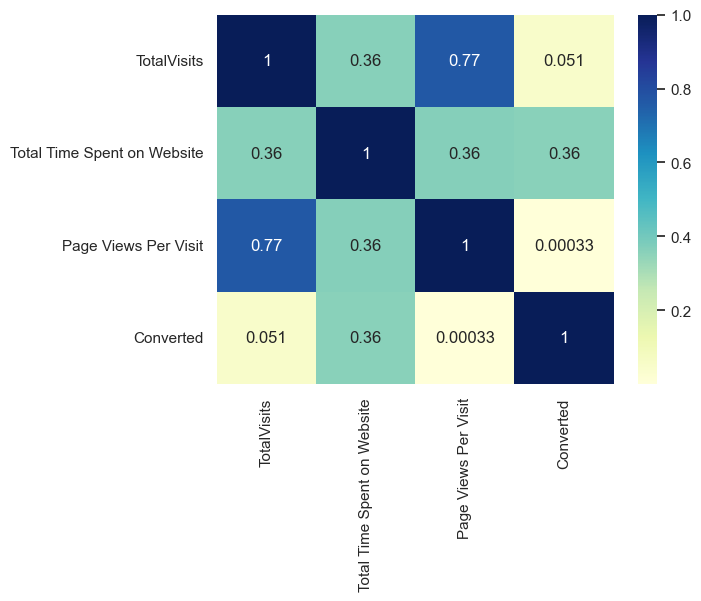

In [40]:
# Plot heatmap
sns.heatmap(cor, cmap="YlGnBu", annot=True)
plt.show()

#### Inference

**Total Visits and Conversion:** Weak correlation, suggesting that the number of visits alone may not strongly predict conversion.

**Total Time Spent on Website and Conversion:** Moderate positive correlation, indicating that longer time spent on the website could lead to higher chances of conversion.

**Page Views Per Visit and Conversion:** Moderate positive correlation, implying that more page views per visit might be associated with a higher likelihood of conversion.

In [41]:
# Dropping unnecessary columns
df_leads = df_leads.drop([
    'Lead Number', 
    'What matters most to you in choosing a course', 
    'Search', 
    'Magazine', 
    'Newspaper Article', 
    'X Education Forums', 
    'Newspaper',
    'Digital Advertisement', 
    'Through Recommendations', 
    'Receive More Updates About Our Courses', 
    'Update me on Supply Chain Content',
    'Get updates on DM Content', 
    'I agree to pay the amount through cheque', 
    'A free copy of Mastering The Interview', 
    'Country', 
    'Do Not Call',
    'Do Not Email'
], axis=1)

df_leads.head()

,Prospect ID,Lead Origin,Lead Source,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Specialization,What is your current occupation,Tags,City,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,API,Olark Chat,0,0.0,0,0.0,Page Visited on Website,Other_Specialization,Unemployed,Interested in other courses,Mumbai,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,API,Organic Search,0,5.0,674,2.5,Email Opened,Other_Specialization,Unemployed,Ringing,Mumbai,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,Landing Page Submission,Direct Traffic,1,2.0,1532,2.0,Email Opened,Business Administration,Student,Will revert after reading the email,Mumbai,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,Landing Page Submission,Direct Traffic,0,1.0,305,1.0,Unreachable,Media and Advertising,Unemployed,Ringing,Mumbai,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,Landing Page Submission,Google,1,2.0,1428,1.0,Converted to Lead,Other_Specialization,Unemployed,Will revert after reading the email,Mumbai,Modified


In [42]:
df_leads.shape

(9074, 13)

## Dummy Variable Creation

In [43]:
dummy = pd.get_dummies(df_leads[[
    'Lead Origin',
    'Lead Source',
    'Last Activity',
    'Specialization',
    'What is your current occupation',
    'Tags',
    'City',
    'Last Notable Activity'
]], drop_first=True, dtype='int64')
dummy.head()

,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Other_Lead_Source,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Olark Chat Conversation,Last Activity_Other Activity,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Other_Specialization,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,Tags_Busy,Tags_Closed by Horizzon,Tags_Interested in full time MBA,Tags_Interested in other courses,Tags_Lost to EINS,Tags_Not doing further education,Tags_Other_Tags,Tags_Ringing,Tags_Will revert after reading the email,Tags_invalid number,Tags_switched off,Tags_wrong number given,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [44]:
# drop the original columns
df_leads = df_leads.drop(['Lead Origin', 'Lead Source', 'Last Activity', 'Specialization','What is your current occupation',
                              'Tags','City','Last Notable Activity'], axis=1)
df_leads.head()

,Prospect ID,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,0,0.0,0,0.0
1,2a272436-5132-4136-86fa-dcc88c88f482,0,5.0,674,2.5
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,1,2.0,1532,2.0
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,0,1.0,305,1.0
4,3256f628-e534-4826-9d63-4a8b88782852,1,2.0,1428,1.0


In [45]:
# concatenate the dummy variables
df_leads = pd.concat([df_leads, dummy], axis=1)
df_leads.head()

,Prospect ID,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Other_Lead_Source,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Olark Chat Conversation,Last Activity_Other Activity,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Other_Specialization,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,Tags_Busy,Tags_Closed by Horizzon,Tags_Interested in full time MBA,Tags_Interested in other courses,Tags_Lost to EINS,Tags_Not doing further education,Tags_Other_Tags,Tags_Ringing,Tags_Will revert after reading the email,Tags_invalid number,Tags_switched off,Tags_wrong number given,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,0,0.0,0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,2a272436-5132-4136-86fa-dcc88c88f482,0,5.0,674,2.5,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,1,2.0,1532,2.0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,0,1.0,305,1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,3256f628-e534-4826-9d63-4a8b88782852,1,2.0,1428,1.0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [46]:
df_leads.shape

(9074, 81)

## Test-Train Split

In [47]:
# Putting feature variable to X
X = df_leads.drop(['Prospect ID','Converted'], axis=1)
# Putting response variable to y
y = df_leads['Converted']

print(y)

0       0
1       0
2       1
3       0
4       1
5       0
6       1
7       0
8       0
9       0
10      1
11      1
12      1
13      0
14      0
15      1
16      0
17      0
18      1
19      0
20      0
21      0
22      1
23      0
24      1
25      1
26      1
27      1
28      0
29      1
30      1
31      0
32      0
33      0
34      1
35      1
36      0
37      1
38      0
39      1
40      0
41      0
42      0
43      0
44      0
45      0
46      0
47      0
48      0
49      0
50      1
51      0
52      0
53      0
54      0
55      0
56      1
57      1
58      0
59      0
60      0
61      0
62      1
63      0
64      1
65      1
66      1
67      1
68      0
69      0
70      0
71      0
72      0
73      0
74      0
75      1
76      1
78      0
80      0
82      1
83      0
84      1
85      0
86      0
87      0
89      0
90      0
91      1
92      0
93      0
94      0
95      0
96      0
97      0
98      1
99      1
100     0
101     1
102     0
103     0


In [48]:
X.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Other_Lead_Source,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Olark Chat Conversation,Last Activity_Other Activity,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Other_Specialization,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,Tags_Busy,Tags_Closed by Horizzon,Tags_Interested in full time MBA,Tags_Interested in other courses,Tags_Lost to EINS,Tags_Not doing further education,Tags_Other_Tags,Tags_Ringing,Tags_Will revert after reading the email,Tags_invalid number,Tags_switched off,Tags_wrong number given,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
0,0.0,0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,5.0,674,2.5,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,2.0,1532,2.0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,1.0,305,1.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,2.0,1428,1.0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [49]:
# Splitting the data into train and test set

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

 ## Feature Scaling 

In [50]:
# Scaling the three numeric features.
scaler = StandardScaler()

X_train[['TotalVisits','Total Time Spent on Website','Page Views Per Visit']] = scaler.fit_transform(X_train[['TotalVisits','Total Time Spent on Website','Page Views Per Visit']])

X_train.head()

,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Other_Lead_Source,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Welingak Website,Last Activity_Email Bounced,Last Activity_Email Link Clicked,Last Activity_Email Opened,Last Activity_Form Submitted on Website,Last Activity_Olark Chat Conversation,Last Activity_Other Activity,Last Activity_Page Visited on Website,Last Activity_SMS Sent,Last Activity_Unreachable,Last Activity_Unsubscribed,Specialization_Business Administration,Specialization_E-Business,Specialization_E-COMMERCE,Specialization_Finance Management,Specialization_Healthcare Management,Specialization_Hospitality Management,Specialization_Human Resource Management,Specialization_IT Projects Management,Specialization_International Business,Specialization_Marketing Management,Specialization_Media and Advertising,Specialization_Operations Management,Specialization_Other_Specialization,Specialization_Retail Management,Specialization_Rural and Agribusiness,Specialization_Services Excellence,Specialization_Supply Chain Management,Specialization_Travel and Tourism,What is your current occupation_Housewife,What is your current occupation_Other,What is your current occupation_Student,What is your current occupation_Unemployed,What is your current occupation_Working Professional,Tags_Busy,Tags_Closed by Horizzon,Tags_Interested in full time MBA,Tags_Interested in other courses,Tags_Lost to EINS,Tags_Not doing further education,Tags_Other_Tags,Tags_Ringing,Tags_Will revert after reading the email,Tags_invalid number,Tags_switched off,Tags_wrong number given,City_Other Cities,City_Other Cities of Maharashtra,City_Other Metro Cities,City_Thane & Outskirts,City_Tier II Cities,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
3009,-0.432779,-0.160255,-0.155018,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1012,-0.432779,-0.540048,-0.155018,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9226,-1.150329,-0.888650,-1.265540,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4750,-0.432779,1.643304,-0.155018,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
7987,0.643547,2.017593,0.122613,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [51]:
# Checking the Conversion Rate of all the leads.

print("Conversion rate is ", (sum(df_leads['Converted'])/len(df_leads['Converted'].index))*100)

Conversion rate is  37.85541106458012


## Looking at Correlations 

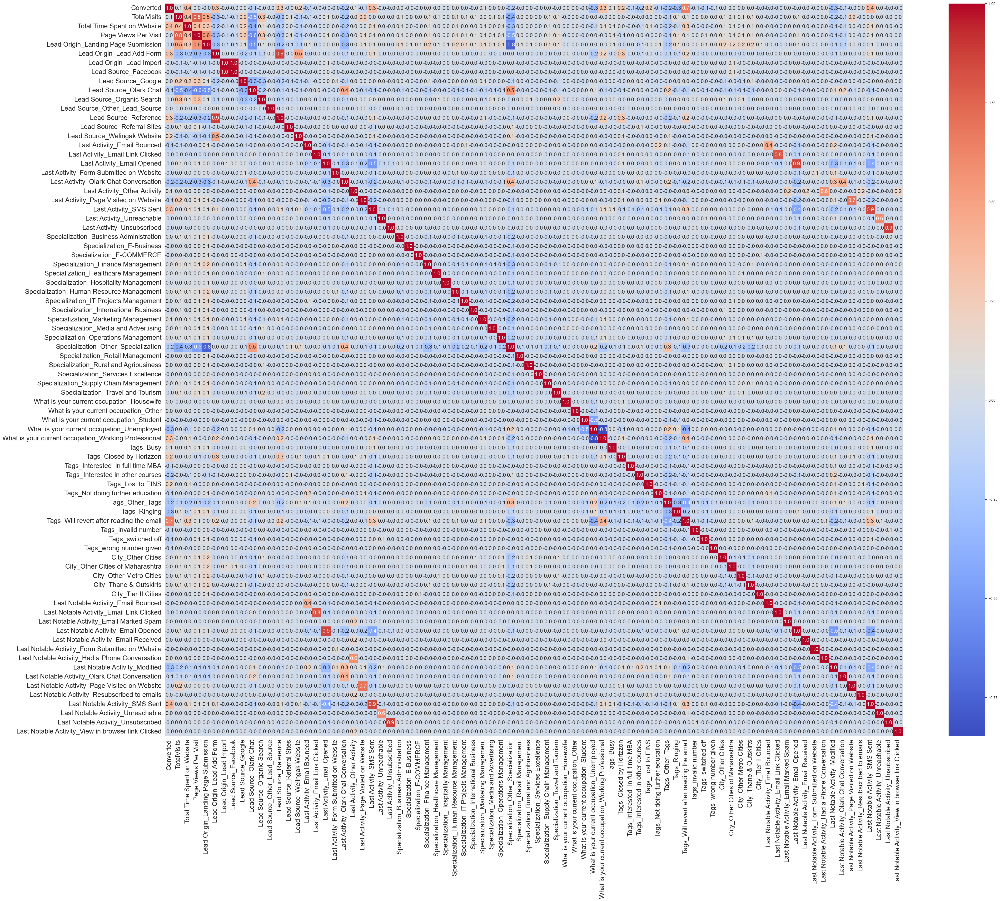

In [52]:
# Excluding the non-numeric 'Prospect ID' column
num_lead = df_leads.drop(columns=['Prospect ID'])

# Let's see the correlation matrix
plt.figure(figsize = (50,40))        # Size of the figure
sns.heatmap(num_lead.corr(), annot=True, fmt='.1f', annot_kws={'size': 16}, cmap='coolwarm')
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.show()

In [53]:
# Select only numeric columns
numeric_df = df_leads.select_dtypes(include=['number'])

# Calculate the correlation matrix
conv_corr = numeric_df.corr()

# Unstack the correlation matrix to find out top correlations
conv_corr_unstacked = conv_corr.unstack().sort_values(kind="quicksort")

conv_corr_unstacked

What is your current occupation_Unemployed            What is your current occupation_Working Professional   -0.847891
What is your current occupation_Working Professional  What is your current occupation_Unemployed             -0.847891
Specialization_Other_Specialization                   Lead Origin_Landing Page Submission                    -0.755381
Lead Origin_Landing Page Submission                   Specialization_Other_Specialization                    -0.755381
Page Views Per Visit                                  Lead Source_Olark Chat                                 -0.579202
Lead Source_Olark Chat                                Page Views Per Visit                                   -0.579202
Lead Origin_Landing Page Submission                   Lead Source_Olark Chat                                 -0.528424
Lead Source_Olark Chat                                Lead Origin_Landing Page Submission                    -0.528424
Last Activity_SMS Sent                          

In [54]:
# Dropping highly correlated features

X_test = X_test.drop(['Lead Source_Facebook','Last Notable Activity_Unsubscribed','Last Notable Activity_SMS Sent',
                      'Last Notable Activity_Email Opened','Last Notable Activity_Unreachable','Last Notable Activity_Email Link Clicked','Last Notable Activity_Page Visited on Website'], axis=1)
X_train = X_train.drop(['Lead Source_Facebook','Last Notable Activity_Unsubscribed','Last Notable Activity_SMS Sent',
                      'Last Notable Activity_Email Opened','Last Notable Activity_Unreachable','Last Notable Activity_Email Link Clicked','Last Notable Activity_Page Visited on Website'], axis=1)

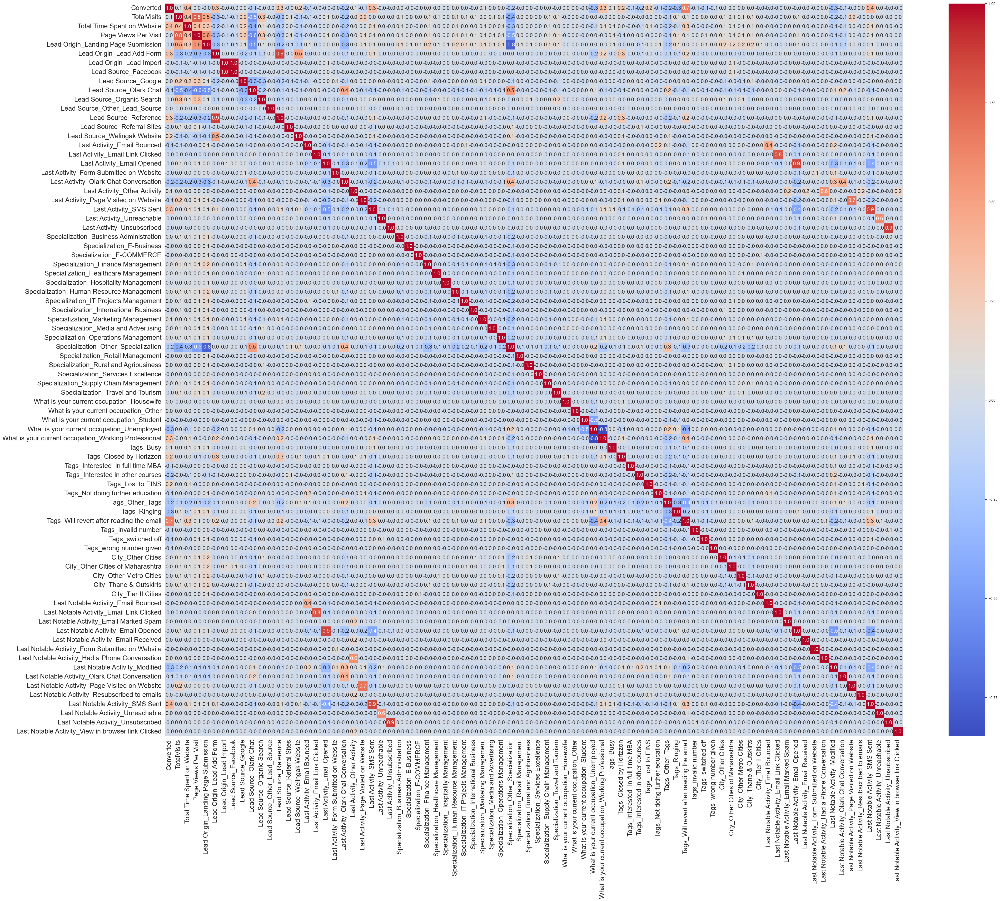

In [55]:
plt.figure(figsize = (50,40))
sns.heatmap(num_lead.corr(), annot=True, fmt='.1f', annot_kws={'size': 16}, cmap='coolwarm')
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)
plt.show()

In [56]:
conv_corr = X_train.corr()

In [57]:
# Assuming conv_corr is your correlation matrix
top_corr = conv_corr.where(np.triu(np.ones(conv_corr.shape), k=1).astype(bool)).stack().sort_values(ascending=False).head(10)

top_corr

Lead Origin_Lead Add Form              Lead Source_Reference                             0.859537
TotalVisits                            Page Views Per Visit                              0.766735
Last Activity_Other Activity           Last Notable Activity_Had a Phone Conversation    0.593057
Page Views Per Visit                   Lead Origin_Landing Page Submission               0.550102
Lead Source_Olark Chat                 Specialization_Other_Specialization               0.505771
Lead Origin_Lead Add Form              Lead Source_Welingak Website                      0.468225
Last Activity_Email Bounced            Last Notable Activity_Email Bounced               0.450911
TotalVisits                            Lead Origin_Landing Page Submission               0.447765
Lead Source_Olark Chat                 Last Activity_Olark Chat Conversation             0.419173
Last Activity_Olark Chat Conversation  Last Notable Activity_Olark Chat Conversation     0.406150
dtype: float64

## Model Building 

In [58]:
# Logistic regression model

logm1 = sm.GLM(y_train,(sm.add_constant(X_train)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6278
Model Family:                Binomial   Df Model:                           72
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1129.1
Date:                Fri, 14 Jun 2024   Deviance:                       2258.3
Time:                        20:53:19   Pearson chi2:                 1.05e+04
No. Iterations:                    23   Pseudo R-squ. (CS):             0.6237
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -2.0287      1.585     -1.280      0.201      -5.135       1.078
TotalVisits                                              0.3017      0.091      3.326      0.001       0.124       0.480
Total Time Spent on Website                              1.1732      0.067     17.513      0.000       1.042       1.305
Page Views Per Visit                                    -0.3484      0.105     -3.326      0.001      -0.554      -0.143
Lead Origin_Landing Page Submission                     -0.7686      0.241     -3.194      0.001      -1.240      -0.297
Lead Origin_Lead Add Form                               -1.3795      2.174     -0.634      0.526      -5.641       2.882
Lead Origin_Lead Import                                  1.1745      0.874      1.345      0.179      -0.538       2.887
Lead Source_Google                                       0.3582      0.166      2.155      0.031       0.032       0.684
Lead Source_Olark Chat                                   1.2504      0.251      4.991      0.000       0.759       1.741
Lead Source_Organic Search                               0.1310      0.222      0.590      0.555      -0.304       0.567
Lead Source_Other_Lead_Source                            1.1753      0.906      1.297      0.195      -0.601       2.951
Lead Source_Reference                                    2.5591      2.221      1.152      0.249      -1.794       6.912
Lead Source_Referral Sites                               0.1502      0.533      0.282      0.778      -0.895       1.195
Lead Source_Welingak Website                             6.8789      2.301      2.989      0.003       2.368      11.390
Last Activity_Email Bounced                             -1.0723      0.852     -1.259      0.208      -2.742       0.597
Last Activity_Email Link Clicked                        -0.5542      0.512     -1.082      0.279      -1.558       0.450
Last Activity_Email Opened                              -0.0624      0.399     -0.156      0.876      -0.845       0.720
Last Activity_Form Submitted on Website                  0.2362      0.704      0.336      0.737      -1.143       1.616
Last Activity_Olark Chat Conversation                   -0.3234      0.450     -0.719      0.472      -1.205       0.558
Last Activity_Other Activity                             2.5782      1.276      2.021      0.043       0.078       5.079
Last Activity_Page Visited on Website                   -0.4782      0.450     -1.061      0.288      -1.361       0.405
Last Activity_SMS Sent                                   2.0531      0.392      5.235      0.000       1.284       2.822
Last Activity_Unreachable                                0

## Feature Selection Using RFE

In [59]:
logreg = LogisticRegression()
rfe = RFE(estimator=logreg, n_features_to_select=15)      # running RFE with 15 variables 
rfe = rfe.fit(X_train, y_train)

In [60]:
rfe.support_

array([False, False, False,  True,  True, False, False, False, False,
       False, False, False,  True, False, False, False, False, False,
       False, False,  True, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True,  True, False, False,  True, False,  True,  True,
        True,  True,  True,  True, False, False, False, False, False,
       False, False, False, False, False,  True,  True, False, False])

In [61]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('TotalVisits', False, 25),
 ('Total Time Spent on Website', False, 2),
 ('Page Views Per Visit', False, 24),
 ('Lead Origin_Landing Page Submission', True, 1),
 ('Lead Origin_Lead Add Form', True, 1),
 ('Lead Origin_Lead Import', False, 10),
 ('Lead Source_Google', False, 23),
 ('Lead Source_Olark Chat', False, 3),
 ('Lead Source_Organic Search', False, 48),
 ('Lead Source_Other_Lead_Source', False, 18),
 ('Lead Source_Reference', False, 27),
 ('Lead Source_Referral Sites', False, 54),
 ('Lead Source_Welingak Website', True, 1),
 ('Last Activity_Email Bounced', False, 8),
 ('Last Activity_Email Link Clicked', False, 15),
 ('Last Activity_Email Opened', False, 56),
 ('Last Activity_Form Submitted on Website', False, 32),
 ('Last Activity_Olark Chat Conversation', False, 14),
 ('Last Activity_Other Activity', False, 4),
 ('Last Activity_Page Visited on Website', False, 22),
 ('Last Activity_SMS Sent', True, 1),
 ('Last Activity_Unreachable', False, 17),
 ('Last Activity_Unsubscribed', 

In [62]:
col = X_train.columns[rfe.support_]

In [63]:
X_train.columns[rfe.support_]

Index(['Lead Origin_Landing Page Submission', 'Lead Origin_Lead Add Form',
       'Lead Source_Welingak Website', 'Last Activity_SMS Sent', 'Tags_Busy',
       'Tags_Closed by Horizzon', 'Tags_Lost to EINS', 'Tags_Other_Tags',
       'Tags_Ringing', 'Tags_Will revert after reading the email',
       'Tags_invalid number', 'Tags_switched off', 'Tags_wrong number given',
       'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Conversation'],
      dtype='object')

#### Assessing the model with StatsModels

In [64]:
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6335
Model Family:                Binomial   Df Model:                           15
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1349.4
Date:                Fri, 14 Jun 2024   Deviance:                       2698.7
Time:                        20:53:24   Pearson chi2:                 1.10e+04
No. Iterations:                    23   Pseudo R-squ. (CS):             0.5967
Covariance Type:            nonrobust                                         
=================================================================================================================
                                                    coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------
const                                            -2.9971      0.265    -11.300      0.000      -3.517      -2.477
Lead Origin_Landing Page Submission              -0.7527      0.108     -6.996      0.000      -0.964      -0.542
Lead Origin_Lead Add Form                        -0.2776      0.445     -0.624      0.533      -1.150       0.595
Lead Source_Welingak Website                      4.3539      0.862      5.051      0.000       2.665       6.043
Last Activity_SMS Sent                            2.1933      0.113     19.371      0.000       1.971       2.415
Tags_Busy                                         2.7311      0.344      7.944      0.000       2.057       3.405
Tags_Closed by Horizzon                           9.4157      0.776     12.132      0.000       7.895      10.937
Tags_Lost to EINS                                 8.7687      0.770     11.394      0.000       7.260      10.277
Tags_Other_Tags                                   1.9801      0.266      7.447      0.000       1.459       2.501
Tags_Ringing                                     -1.4156      0.356     -3.976      0.000      -2.113      -0.718
Tags_Will revert after reading the email          7.2195      0.320     22.582      0.000       6.593       7.846
Tags_invalid number                             -21.9961   1.53e+04     -0.001      0.999   -3.01e+04       3e+04
Tags_switched off                                -1.4956      0.583     -2.566      0.010      -2.638      -0.353
Tags_wrong number given                         -21.8547   2.11e+04     -0.001      0.999   -4.14e+04    4.14e+04
Last Notable Activity_Modified                   -1.9088      0.123    -15.479      0.000      -2.150      -1.667
Last Notable Activity_Olark Chat Conversation    -1.3372      0.378     -3.537      0.000      -2.078      -0.596
=================================================================================================================
"""

In [65]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

3009    0.145572
1012    0.145572
9226    0.015857
4750    0.604341
7987    0.995050
1281    0.996540
2880    0.145572
4971    0.872949
7536    0.969813
1248    0.007533
dtype: float64

In [66]:
y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.14557221, 0.14557221, 0.01585732, 0.60434071, 0.99504998,
       0.99654004, 0.14557221, 0.87294859, 0.96981291, 0.00753338])

In [67]:
y_train_pred_final = pd.DataFrame({'Converted':y_train.values, 'Converted_Prob':y_train_pred})
y_train_pred_final['Pros-ID'] = y_train.index
y_train_pred_final.head()

,Converted,Converted_Prob,Pros-ID
0,0,0.145572,3009
1,0,0.145572,1012
2,0,0.015857,9226
3,1,0.604341,4750
4,1,0.995050,7987


In [68]:
y_train_pred_final['predicted'] = y_train_pred_final.Converted_Prob.map(lambda x: 1 if x > 0.5 else 0)
# Let's see the head
y_train_pred_final.head()

,Converted,Converted_Prob,Pros-ID,predicted
0,0,0.145572,3009,0
1,0,0.145572,1012,0
2,0,0.015857,9226,0
3,1,0.604341,4750,1
4,1,0.995050,7987,1


In [69]:
# Confusion matrix 
confusion = metrics.confusion_matrix(y_train_pred_final.Converted, y_train_pred_final.predicted)
print(confusion)

[[3749  156]
 [ 314 2132]]


In [70]:
# cheking the Accuracy score
print("Accuracy score", metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.predicted))

Accuracy score 0.9259959061565108


## Checking VIFs

In [71]:
def calculate_vif(X_train):
    vif_df = pd.DataFrame()
    vif_df['Features'] = X_train.columns
    vif_df['Variance Inflation Factor'] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
    vif_df['Variance Inflation Factor'] = round(vif_df['Variance Inflation Factor'], 2)
    vif_df = vif_df.sort_values(by = 'Variance Inflation Factor', ascending = False)
    print(vif_df)
    
# Calucating VIF
calculate_vif(X_train[col])

                                         Features  Variance Inflation Factor
0             Lead Origin_Landing Page Submission                       2.18
9        Tags_Will revert after reading the email                       1.80
7                                 Tags_Other_Tags                       1.76
1                       Lead Origin_Lead Add Form                       1.74
3                          Last Activity_SMS Sent                       1.71
13                 Last Notable Activity_Modified                       1.47
2                    Lead Source_Welingak Website                       1.36
8                                    Tags_Ringing                       1.35
5                         Tags_Closed by Horizzon                       1.22
4                                       Tags_Busy                       1.09
11                              Tags_switched off                       1.08
6                               Tags_Lost to EINS                       1.07

All variables have a good value of VIF. But we observed earlier that the column `Tags_invalid number` and `Tags_wrong number given` has high p-value and hence we will drop this column and remake the model.

In [72]:
col = col.drop('Tags_invalid number')
col

Index(['Lead Origin_Landing Page Submission', 'Lead Origin_Lead Add Form',
       'Lead Source_Welingak Website', 'Last Activity_SMS Sent', 'Tags_Busy',
       'Tags_Closed by Horizzon', 'Tags_Lost to EINS', 'Tags_Other_Tags',
       'Tags_Ringing', 'Tags_Will revert after reading the email',
       'Tags_switched off', 'Tags_wrong number given',
       'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Conversation'],
      dtype='object')

In [73]:
# Let's 2nd the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6336
Model Family:                Binomial   Df Model:                           14
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1353.8
Date:                Fri, 14 Jun 2024   Deviance:                       2707.5
Time:                        20:53:24   Pearson chi2:                 1.10e+04
No. Iterations:                    22   Pseudo R-squ. (CS):             0.5962
Covariance Type:            nonrobust                                         
=================================================================================================================
                                                    coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------
const                                            -3.2617      0.267    -12.202      0.000      -3.786      -2.738
Lead Origin_Landing Page Submission              -0.7588      0.107     -7.063      0.000      -0.969      -0.548
Lead Origin_Lead Add Form                        -0.2702      0.445     -0.607      0.544      -1.143       0.602
Lead Source_Welingak Website                      4.3390      0.861      5.037      0.000       2.651       6.027
Last Activity_SMS Sent                            2.1657      0.112     19.296      0.000       1.946       2.386
Tags_Busy                                         3.0162      0.341      8.833      0.000       2.347       3.686
Tags_Closed by Horizzon                           9.6673      0.778     12.432      0.000       8.143      11.191
Tags_Lost to EINS                                 9.0248      0.771     11.706      0.000       7.514      10.536
Tags_Other_Tags                                   2.2536      0.266      8.471      0.000       1.732       2.775
Tags_Ringing                                     -1.1251      0.353     -3.187      0.001      -1.817      -0.433
Tags_Will revert after reading the email          7.4818      0.322     23.248      0.000       6.851       8.113
Tags_switched off                                -1.2027      0.581     -2.071      0.038      -2.341      -0.064
Tags_wrong number given                         -20.5664   1.28e+04     -0.002      0.999   -2.52e+04    2.51e+04
Last Notable Activity_Modified                   -1.8920      0.123    -15.373      0.000      -2.133      -1.651
Last Notable Activity_Olark Chat Conversation    -1.3381      0.378     -3.539      0.000      -2.079      -0.597
=================================================================================================================
"""

In [74]:
col = col.drop('Tags_wrong number given')
col

Index(['Lead Origin_Landing Page Submission', 'Lead Origin_Lead Add Form',
       'Lead Source_Welingak Website', 'Last Activity_SMS Sent', 'Tags_Busy',
       'Tags_Closed by Horizzon', 'Tags_Lost to EINS', 'Tags_Other_Tags',
       'Tags_Ringing', 'Tags_Will revert after reading the email',
       'Tags_switched off', 'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Conversation'],
      dtype='object')

In [75]:
# Let's 3nd the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6337
Model Family:                Binomial   Df Model:                           13
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1355.4
Date:                Fri, 14 Jun 2024   Deviance:                       2710.9
Time:                        20:53:24   Pearson chi2:                 1.10e+04
No. Iterations:                     8   Pseudo R-squ. (CS):             0.5959
Covariance Type:            nonrobust                                         
=================================================================================================================
                                                    coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------
const                                            -3.3647      0.268    -12.555      0.000      -3.890      -2.839
Lead Origin_Landing Page Submission              -0.7643      0.107     -7.112      0.000      -0.975      -0.554
Lead Origin_Lead Add Form                        -0.2702      0.445     -0.607      0.544      -1.143       0.603
Lead Source_Welingak Website                      4.3352      0.861      5.033      0.000       2.647       6.023
Last Activity_SMS Sent                            2.1569      0.112     19.250      0.000       1.937       2.377
Tags_Busy                                         3.1288      0.340      9.196      0.000       2.462       3.796
Tags_Closed by Horizzon                           9.7700      0.778     12.560      0.000       8.245      11.295
Tags_Lost to EINS                                 9.1291      0.771     11.839      0.000       7.618      10.640
Tags_Other_Tags                                   2.3612      0.266      8.886      0.000       1.840       2.882
Tags_Ringing                                     -1.0117      0.352     -2.876      0.004      -1.701      -0.322
Tags_Will revert after reading the email          7.5875      0.322     23.563      0.000       6.956       8.219
Tags_switched off                                -1.0885      0.580     -1.877      0.060      -2.225       0.048
Last Notable Activity_Modified                   -1.8878      0.123    -15.346      0.000      -2.129      -1.647
Last Notable Activity_Olark Chat Conversation    -1.3394      0.378     -3.542      0.000      -2.081      -0.598
=================================================================================================================
"""

In [76]:
col = col.drop('Lead Origin_Lead Add Form')
col

Index(['Lead Origin_Landing Page Submission', 'Lead Source_Welingak Website',
       'Last Activity_SMS Sent', 'Tags_Busy', 'Tags_Closed by Horizzon',
       'Tags_Lost to EINS', 'Tags_Other_Tags', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_switched off',
       'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Conversation'],
      dtype='object')

In [77]:
# Let's 4nd the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm4 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm4.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6338
Model Family:                Binomial   Df Model:                           12
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1355.6
Date:                Fri, 14 Jun 2024   Deviance:                       2711.3
Time:                        20:53:24   Pearson chi2:                 1.09e+04
No. Iterations:                     8   Pseudo R-squ. (CS):             0.5959
Covariance Type:            nonrobust                                         
=================================================================================================================
                                                    coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------
const                                            -3.3699      0.268    -12.583      0.000      -3.895      -2.845
Lead Origin_Landing Page Submission              -0.7542      0.106     -7.109      0.000      -0.962      -0.546
Lead Source_Welingak Website                      4.0703      0.742      5.483      0.000       2.615       5.525
Last Activity_SMS Sent                            2.1520      0.112     19.267      0.000       1.933       2.371
Tags_Busy                                         3.1285      0.340      9.199      0.000       2.462       3.795
Tags_Closed by Horizzon                           9.6902      0.765     12.670      0.000       8.191      11.189
Tags_Lost to EINS                                 9.1136      0.771     11.826      0.000       7.603      10.624
Tags_Other_Tags                                   2.3612      0.266      8.888      0.000       1.840       2.882
Tags_Ringing                                     -1.0224      0.351     -2.909      0.004      -1.711      -0.334
Tags_Will revert after reading the email          7.5684      0.320     23.633      0.000       6.941       8.196
Tags_switched off                                -1.0853      0.580     -1.872      0.061      -2.222       0.051
Last Notable Activity_Modified                   -1.8837      0.123    -15.346      0.000      -2.124      -1.643
Last Notable Activity_Olark Chat Conversation    -1.3341      0.378     -3.530      0.000      -2.075      -0.593
=================================================================================================================
"""

In [78]:
col = col.drop('Tags_switched off')
col

Index(['Lead Origin_Landing Page Submission', 'Lead Source_Welingak Website',
       'Last Activity_SMS Sent', 'Tags_Busy', 'Tags_Closed by Horizzon',
       'Tags_Lost to EINS', 'Tags_Other_Tags', 'Tags_Ringing',
       'Tags_Will revert after reading the email',
       'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Conversation'],
      dtype='object')

In [79]:
# Let's 5nd the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm5 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm5.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6351
Model:                            GLM   Df Residuals:                     6339
Model Family:                Binomial   Df Model:                           11
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1357.7
Date:                Fri, 14 Jun 2024   Deviance:                       2715.4
Time:                        20:53:25   Pearson chi2:                 1.03e+04
No. Iterations:                     8   Pseudo R-squ. (CS):             0.5957
Covariance Type:            nonrobust                                         
=================================================================================================================
                                                    coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------
const                                            -3.6726      0.246    -14.912      0.000      -4.155      -3.190
Lead Origin_Landing Page Submission              -0.7554      0.106     -7.134      0.000      -0.963      -0.548
Lead Source_Welingak Website                      4.0656      0.742      5.480      0.000       2.612       5.520
Last Activity_SMS Sent                            2.1269      0.111     19.183      0.000       1.910       2.344
Tags_Busy                                         3.4467      0.318     10.827      0.000       2.823       4.071
Tags_Closed by Horizzon                           9.9822      0.759     13.155      0.000       8.495      11.469
Tags_Lost to EINS                                 9.4068      0.765     12.304      0.000       7.908      10.905
Tags_Other_Tags                                   2.6705      0.241     11.067      0.000       2.198       3.143
Tags_Ringing                                     -0.6984      0.329     -2.123      0.034      -1.343      -0.054
Tags_Will revert after reading the email          7.8672      0.303     25.922      0.000       7.272       8.462
Last Notable Activity_Modified                   -1.8700      0.123    -15.255      0.000      -2.110      -1.630
Last Notable Activity_Olark Chat Conversation    -1.3332      0.378     -3.526      0.000      -2.074      -0.592
=================================================================================================================
"""

In [80]:
y_train_pred = res.predict(X_train_sm).values.reshape(-1)
y_train_pred_final['Convert_Prob'] = y_train_pred

# Creating new column 'predicted' with 1 if Convert_Prob > 0.5 else 0
y_train_pred_final['predicted'] = y_train_pred_final.Convert_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_pred_final.head()

,Converted,Converted_Prob,Pros-ID,predicted,Convert_Prob
0,0,0.145572,3009,0,0.147100
1,0,0.145572,1012,0,0.147100
2,0,0.015857,9226,0,0.016077
3,1,0.604341,4750,1,0.591308
4,1,0.995050,7987,1,0.994705


In [81]:
# Let's check the overall accuracy.
print("Accuracy score", metrics.accuracy_score(y_train_pred_final.Converted, y_train_pred_final.predicted))

Accuracy score 0.9259959061565108


The accuracy is still practically the same.

Let's now check the VIFs again

In [82]:
calculate_vif(X_train[col])

                                         Features  Variance Inflation Factor
0             Lead Origin_Landing Page Submission                       1.90
6                                 Tags_Other_Tags                       1.68
2                          Last Activity_SMS Sent                       1.63
8        Tags_Will revert after reading the email                       1.54
9                  Last Notable Activity_Modified                       1.45
7                                    Tags_Ringing                       1.30
3                                       Tags_Busy                       1.08
4                         Tags_Closed by Horizzon                       1.07
1                    Lead Source_Welingak Website                       1.06
5                               Tags_Lost to EINS                       1.05
10  Last Notable Activity_Olark Chat Conversation                       1.04


All variables exhibit satisfactory VIF and p-values. Therefore, there’s no need to eliminate any more variables, and we can continue to make predictions using this model as it is.

In [83]:
# function name : evaluate_model
# argumet : y_true, y_predicted
# prints Confusion matrix, accuracy, Sensitivity, Specificity, False Positive Rate, Positive Predictive Value
# returns accuracy, Sensitivity, Specificity

def evaluate_model(y_true, y_predicted, print_score=False):
    confusion = metrics.confusion_matrix(y_true, y_predicted)
    # Predicted     not_converted    converted
    # Actual
    # not_converted        TN         FP
    # converted            FN         TP

    TP = confusion[1,1] # true positive 
    TN = confusion[0,0] # true negatives
    FP = confusion[0,1] # false positives
    FN = confusion[1,0] # false negatives

    accuracy_sc = metrics.accuracy_score(y_true, y_predicted)
    sensitivity_score = TP / float(TP+FN)
    specificity_score = TN / float(TN+FP)
    precision_sc = precision_score(y_true, y_predicted)
    f1_sc = metrics.f1_score(y_true, y_predicted)
    auc_sc = metrics.roc_auc_score(y_true, y_predicted)
    
    if print_score:
        print("Confusion Matrix :\n", confusion)
        print("Accuracy :", accuracy_sc)
        print("Sensitivity :", sensitivity_score)
        print("Specificity :", specificity_score)
        print("Precision :", precision_sc)
        print("F1 Score :", f1_sc)
        print("AUC Score :", auc_sc)
        return None
    else:
        return accuracy_sc, sensitivity_score, specificity_score, precision_sc

In [84]:
# Evaluating model
evaluate_model(y_train_pred_final.Converted, y_train_pred_final.predicted, print_score=True)

Confusion Matrix :
 [[3749  156]
 [ 314 2132]]
Accuracy : 0.9259959061565108
Sensitivity : 0.8716271463614064
Specificity : 0.9600512163892445
Precision : 0.9318181818181818
F1 Score : 0.9007182087029996
AUC Score : 0.9158391813753254


In [85]:
y_train_pred_final.head()

,Converted,Converted_Prob,Pros-ID,predicted,Convert_Prob
0,0,0.145572,3009,0,0.147100
1,0,0.145572,1012,0,0.147100
2,0,0.015857,9226,0,0.016077
3,1,0.604341,4750,1,0.591308
4,1,0.995050,7987,1,0.994705


In [86]:
# F1 Score
f1 = metrics.f1_score(y_train_pred_final.Converted, y_train_pred_final.predicted)
print(f'F1 Score: {f1:.2f}')


F1 Score: 0.90


In [87]:
# AUC
auc = metrics.roc_auc_score(y_train_pred_final.Converted, y_train_pred_final.Converted_Prob)
print(f'AUC: {auc:.2f}')

AUC: 0.97


## Plotting the ROC Curve

**An ROC curve**

**Sensitivity and Specificity Tradeoff:** The ROC curve illustrates the tradeoff between sensitivity (true positive rate) and specificity (true negative rate). Improving one typically reduces the other.

**Area Under the Curve (AUC):** A curve that closely follows the y-axis and the top border of the ROC space indicates a larger AUC, suggesting higher accuracy of the test or model.

**Diagonal Reference Line:** The closer the ROC curve is to the 45-degree diagonal line (the reference line), the smaller the AUC, indicating lower accuracy of the test or model.

Here, our goal is to have achieve good sensitivity score

In [88]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()

    return None


In [89]:

fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Converted, y_train_pred_final.Convert_Prob, drop_intermediate = False )

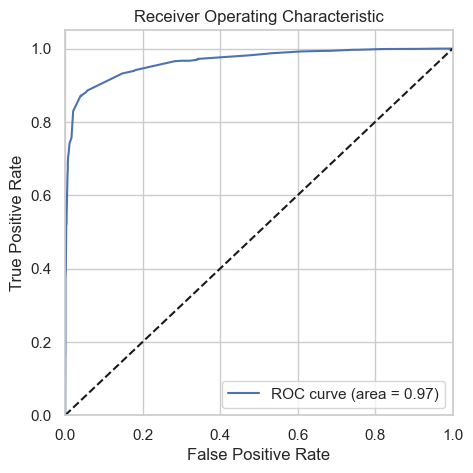

In [90]:
draw_roc(y_train_pred_final.Converted, y_train_pred_final.Convert_Prob)

### Finding optimal value of the cut off

In [91]:
# Predicting Convert status with different probability cutoffs

for i in [float(x)/10 for x in range(10)]:
    y_train_pred_final[i]= y_train_pred_final.Convert_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Converted,Converted_Prob,Pros-ID,predicted,Convert_Prob,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.145572,3009,0,0.147100,1,1,0,0,0,0,0,0,0,0
1,0,0.145572,1012,0,0.147100,1,1,0,0,0,0,0,0,0,0
2,0,0.015857,9226,0,0.016077,1,0,0,0,0,0,0,0,0,0
3,1,0.604341,4750,1,0.591308,1,1,1,1,1,1,0,0,0,0
4,1,0.995050,7987,1,0.994705,1,1,1,1,1,1,1,1,1,1


In [92]:
# Calculating accuracy, sensitivity and specificity for various probability cutoffs from 0.1 to 0.9.

df = pd.DataFrame(columns = ['probability_score','accuracy_score','sensitivity_score','specificity_score','precision_score'])

for i in [float(x)/10 for x in range(10)]:
    (accuracy_score,sensitivity_score,specificity_score,precision_sc) = evaluate_model(y_train_pred_final.Converted, y_train_pred_final[i])
    df.loc[i] =[i,accuracy_score,sensitivity_score,specificity_score,precision_sc]

df

,probability_score,accuracy_score,sensitivity_score,specificity_score,precision_score
0.0,0.0,0.385136,1.000000,0.000000,0.385136
0.1,0.1,0.812628,0.965658,0.716773,0.681084
0.2,0.2,0.883168,0.932134,0.852497,0.798319
0.3,0.3,0.920957,0.881030,0.945967,0.910820
0.4,0.4,0.924579,0.871627,0.957746,0.928167
0.5,0.5,0.925996,0.871627,0.960051,0.931818
0.6,0.6,0.921587,0.829518,0.979257,0.961611
0.7,0.7,0.921587,0.829518,0.979257,0.961611
0.8,0.8,0.893245,0.740801,0.988732,0.976293
0.9,0.9,0.882223,0.706868,0.992061,0.982386


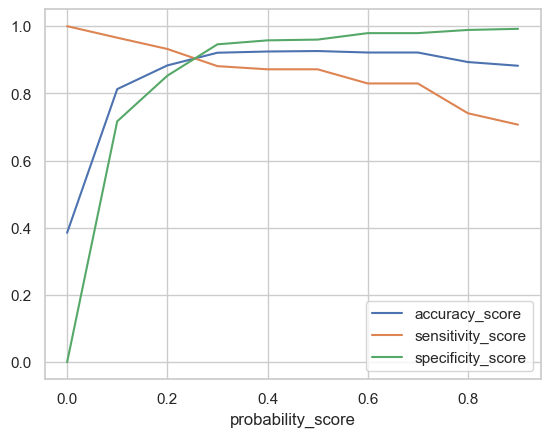

In [93]:
df.plot.line(x='probability_score', y=['accuracy_score','sensitivity_score','specificity_score'])
plt.show()

### Precision-Recall Trade off

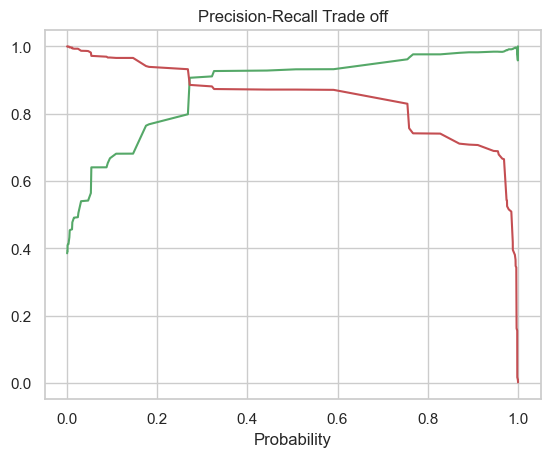

In [94]:
p, r, thresholds = precision_recall_curve(y_train_pred_final.Converted, y_train_pred_final.Convert_Prob)

plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.xlabel("Probability")
plt.title("Precision-Recall Trade off")
plt.show()

**Inference**

**Sensitivity-Specificity-Accuracy Plot:** At a probability cutoff of 0.27, the Sensitivity-Specificity-Accuracy plot suggests an optimal point. This cutoff balances sensitivity (true positive rate), specificity (true negative rate), and overall accuracy effectively.

**Precision-Recall Curve:** The Precision-Recall curve indicates that a cutoff probability of 0.3 is optimal. This threshold maximizes precision (positive predictive value) and recall (sensitivity) for the model.

**Cutoff Probability Selection:** Based on these analyses, 0.27 is chosen as the optimal cutoff probability for assigning Lead Scores in the training data. This ensures a balance between correctly identifying leads and minimizing misclassifications.

In [95]:
y_train_pred_final = y_train_pred_final.iloc[:, :3]
y_train_pred_final['Convert_predicted'] = y_train_pred_final.Converted_Prob.map(lambda x: 1 if x > 0.3 else 0)

y_train_pred_final['Lead_Score'] = y_train_pred_final.Converted_Prob.map(lambda x: round(x*100))
y_train_pred_final.head()

,Converted,Converted_Prob,Pros-ID,Convert_predicted,Lead_Score
0,0,0.145572,3009,0,15
1,0,0.145572,1012,0,15
2,0,0.015857,9226,0,2
3,1,0.604341,4750,1,60
4,1,0.995050,7987,1,100


In [96]:
# Evaluating model performance on training data

evaluate_model(y_train_pred_final.Converted, y_train_pred_final.Convert_predicted, print_score=True)

Confusion Matrix :
 [[3694  211]
 [ 286 2160]]
Accuracy : 0.9217446071484805
Sensitivity : 0.8830744071954211
Specificity : 0.945966709346991
Precision : 0.911008013496415
F1 Score : 0.8968237492215072
AUC Score : 0.914520558271206


In [97]:
# Getting the predicted values on the test set
X_test_sm = sm.add_constant(X_test[col])
y_test_pred = res.predict(X_test_sm)

y_test_df = pd.DataFrame(y_test)
y_test_pred_df = pd.DataFrame(y_test_pred, columns=["Converting_Probability"])
y_test_df['Prospect ID'] = y_test_df.index

y_predicted_final = pd.concat([y_test_df.reset_index(drop=True), y_test_pred_df.reset_index(drop=True)],axis=1)
y_predicted_final['final_predicted'] = y_predicted_final.Converting_Probability.map(lambda x: 1 if x > 0.3 else 0)
y_predicted_final['Lead_Score'] = y_predicted_final.Converting_Probability.map(lambda x: round(x*100))

y_predicted_final.head()

,Converted,Prospect ID,Converting_Probability,final_predicted,Lead_Score
0,0,3271,0.268526,0,27
1,1,1490,0.968905,1,97
2,0,7936,0.268526,0,27
3,1,4216,0.988336,1,99
4,0,3830,0.147100,0,15


In [98]:
# Evaluating model performance on test data

evaluate_model(y_predicted_final.Converted, y_predicted_final.final_predicted, print_score=True)

Confusion Matrix :
 [[1634  100]
 [ 133  856]]
Accuracy : 0.9144326110907087
Sensitivity : 0.865520728008089
Specificity : 0.9423298731257209
Precision : 0.895397489539749
F1 Score : 0.8802056555269923
AUC Score : 0.9039253005669049


## Final Model 

In [99]:
def build_model_cutoff(X_train, y_train, X_test, y_test, cutoff=0.5):
    
    # Train model
    X_train_sm = sm.add_constant(X_train)
    logm5 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
    res = logm5.fit()

    y_train_pred = res.predict(X_train_sm).values.reshape(-1)
    
    y_train_pred_final = pd.DataFrame({'Prospect ID':y_train.index, 'Converted':y_train.values, 'Convert_Probability':y_train_pred})
    y_train_pred_final['Convert_predicted'] = y_train_pred_final.Convert_Probability.map(lambda x: 1 if x > cutoff else 0)
    y_train_pred_final['Lead_Score'] = y_train_pred_final.Convert_Probability.map(lambda x: round(x*100))
    print("------------------Result of training data-------------------")
    print(y_train_pred_final.head())
    
    # Predicting Lead Score on Test data
    X_test_sm = sm.add_constant(X_test)
    y_test_pred = res.predict(X_test_sm)

    y_test_pred_final = pd.DataFrame({'Prospect ID':y_test.index, 'Converted':y_test.values, 'Convert_Probability':y_test_pred})
    y_test_pred_final['Convert_predicted'] = y_test_pred_final.Convert_Probability.map(lambda x: 1 if x > cutoff else 0)
    y_test_pred_final['Lead_Score'] = y_test_pred_final.Convert_Probability.map(lambda x: round(x*100))
    y_test_pred_final.reset_index(inplace=True, drop=True)
    print("------------------Result of test data-------------------")
    print(y_test_pred_final.head())
    
    print("------------------Model Evaluation Metrics-------------------")
    evaluate_model(y_test_pred_final.Converted, y_test_pred_final.Convert_predicted, print_score=True)
    
    return y_test_pred_final

In [100]:
build_model_cutoff(X_train[col], y_train, X_test[col], y_test, cutoff=0.3)

------------------Result of training data-------------------
   Prospect ID  Converted  Convert_Probability  Convert_predicted  Lead_Score
0         3009          0             0.147100                  0          15
1         1012          0             0.147100                  0          15
2         9226          0             0.016077                  0           2
3         4750          1             0.591308                  1          59
4         7987          1             0.994705                  1          99
------------------Result of test data-------------------
   Prospect ID  Converted  Convert_Probability  Convert_predicted  Lead_Score
0         3271          0             0.268526                  0          27
1         1490          1             0.968905                  1          97
2         7936          0             0.268526                  0          27
3         4216          1             0.988336                  1          99
4         3830          

,Prospect ID,Converted,Convert_Probability,Convert_predicted,Lead_Score
0,3271,0,0.268526,0,27
1,1490,1,0.968905,1,97
2,7936,0,0.268526,0,27
3,4216,1,0.988336,1,99
4,3830,0,0.147100,0,15
5,1800,1,0.968905,1,97
6,6507,0,0.047446,0,5
7,4821,0,0.011797,0,1
8,4223,1,0.998206,1,100
9,4714,0,0.321856,1,32


### Accuracy Summary

Accuracy: 0.91 (91% of the instances are correctly classified)

Confusion Matrix:

True Positives (TP): 856 
True Negatives (TN): 1634 
False Positives (FP): 100 
False Negatives (FN): 133 

Precision:  0.89 (89% of the predicted positives are correct)

Recall: 0.86 (86% of the actual positives are correctly predicted)

F1 Score: 0.88

Specificity: 0.94 (94% of the actual negatives are correctly predicted)

ROC-AUC Score: 0.90

In [101]:
print("Features used in Final Model :", col)

print("-----------------------Feature Importance--------------------")
print(res.params)

Features used in Final Model : Index(['Lead Origin_Landing Page Submission', 'Lead Source_Welingak Website',
       'Last Activity_SMS Sent', 'Tags_Busy', 'Tags_Closed by Horizzon',
       'Tags_Lost to EINS', 'Tags_Other_Tags', 'Tags_Ringing',
       'Tags_Will revert after reading the email',
       'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Conversation'],
      dtype='object')
-----------------------Feature Importance--------------------
const                                           -3.672603
Lead Origin_Landing Page Submission             -0.755416
Lead Source_Welingak Website                     4.065618
Last Activity_SMS Sent                           2.126905
Tags_Busy                                        3.446670
Tags_Closed by Horizzon                          9.982162
Tags_Lost to EINS                                9.406768
Tags_Other_Tags                                  2.670490
Tags_Ringing                                    -0.698439


## Subjective Question


1 - Based on the feature importance scores provided, the top three variables that contribute most towards the probability of a lead getting converted are:

Tags_Closed by Horizzon: Feature importance score of 9.982162.

Tags_Will revert after reading the email: Feature importance score of 7.867150.

Tags_Lost to EINS: Feature importance score of 9.406768.

2 - What are the top 3 categorical/dummy variables in the model which get maximum focus in order to increase the probability of lead conversion?

Tags_Closed by Horizzon: Feature importance score of 9.982162.

Tags_Will revert after reading the email: Feature importance score of 7.867150.

Tags_Lost to EINS: Feature importance score of 9.406768.

3 - X Education has a period of 2 months every year during which they hire some interns. The sales team, in particular, has around 10 interns allotted to them. So during this phase, they wish to make the lead conversion more aggressive. So they want almost all of the potential leads (i.e. the customers who have been predicted as 1 by the model) to be converted and hence, want to make phone calls to as much of such people as possible. Suggest a good strategy they should employ at this stage.

In [102]:
build_model_cutoff(X_train[col], y_train, X_test[col], y_test, cutoff=0.1)

------------------Result of training data-------------------
   Prospect ID  Converted  Convert_Probability  Convert_predicted  Lead_Score
0         3009          0             0.147100                  1          15
1         1012          0             0.147100                  1          15
2         9226          0             0.016077                  0           2
3         4750          1             0.591308                  1          59
4         7987          1             0.994705                  1          99
------------------Result of test data-------------------
   Prospect ID  Converted  Convert_Probability  Convert_predicted  Lead_Score
0         3271          0             0.268526                  1          27
1         1490          1             0.968905                  1          97
2         7936          0             0.268526                  1          27
3         4216          1             0.988336                  1          99
4         3830          

,Prospect ID,Converted,Convert_Probability,Convert_predicted,Lead_Score
0,3271,0,0.268526,1,27
1,1490,1,0.968905,1,97
2,7936,0,0.268526,1,27
3,4216,1,0.988336,1,99
4,3830,0,0.147100,1,15
5,1800,1,0.968905,1,97
6,6507,0,0.047446,0,5
7,4821,0,0.011797,0,1
8,4223,1,0.998206,1,100
9,4714,0,0.321856,1,32


4 - Similarly, at times, the company reaches its target for a quarter before the deadline. During this time, the company wants the sales team to focus on some new work as well. So during this time, the company’s aim is to not make phone calls unless it’s extremely necessary, i.e. they want to minimize the rate of useless phone calls. Suggest a strategy they should employ at this stage.

In [103]:

build_model_cutoff(X_train[col], y_train, X_test[col], y_test, cutoff=0.9)

------------------Result of training data-------------------
   Prospect ID  Converted  Convert_Probability  Convert_predicted  Lead_Score
0         3009          0             0.147100                  0          15
1         1012          0             0.147100                  0          15
2         9226          0             0.016077                  0           2
3         4750          1             0.591308                  0          59
4         7987          1             0.994705                  1          99
------------------Result of test data-------------------
   Prospect ID  Converted  Convert_Probability  Convert_predicted  Lead_Score
0         3271          0             0.268526                  0          27
1         1490          1             0.968905                  1          97
2         7936          0             0.268526                  0          27
3         4216          1             0.988336                  1          99
4         3830          

,Prospect ID,Converted,Convert_Probability,Convert_predicted,Lead_Score
0,3271,0,0.268526,0,27
1,1490,1,0.968905,1,97
2,7936,0,0.268526,0,27
3,4216,1,0.988336,1,99
4,3830,0,0.147100,0,15
5,1800,1,0.968905,1,97
6,6507,0,0.047446,0,5
7,4821,0,0.011797,0,1
8,4223,1,0.998206,1,100
9,4714,0,0.321856,0,32
